In [2]:
import matplotlib.pyplot as plt
import pandas as pd
import torch
import numpy as np
import seaborn as sns
from matplotlib import animation
from brokenaxes import brokenaxes

import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

In [3]:

output_matrix=torch.load("./pick_up_ball_data/small/red/0ec0d9a9-52f2-4a00-8bb8-b2265616a6ca_attentions.pt", map_location=torch.device('cpu'))

print("Number of timesteps: ", len(output_matrix))
print("Number of layers in timesteps : ", len(output_matrix[0]))
print("Number of attention heads: ", len(output_matrix[0][0]))
print("Number of query tokens per layer (state token + 16 action horizon): ", len(output_matrix[0][0][0]))
print("Number of key tokens per layer (outputs of VLM): ", len(output_matrix[0][0][1]))



Number of timesteps:  33
Number of layers in timesteps :  16
Number of attention heads:  32
Number of query tokens per layer (state token + 16 action horizon):  17
Number of key tokens per layer (outputs of VLM):  17


In [4]:
#We now are interested in the cross attention layers and not the self attention layers, so we will gather them per prediction
def extract_cross_attentions(output_matrix):
    all_cross_attentions=[]
    for timestep in output_matrix:
        cross_attentions=[]
        for prediction in timestep:
            if prediction.shape[2] != prediction.shape[1]:#-> self attention, skip
                cross_attentions.append(prediction)
        all_cross_attentions.append(cross_attentions)
    return all_cross_attentions
all_cross_attentions= extract_cross_attentions(output_matrix)
#After collecting only the relevant cross attention layers, we can now select the relevant timesteps, before flattening the predicitons 
#And having one continouous timeline

reaching=all_cross_attentions[:6] 
grabbing=all_cross_attentions[6:11]

In [5]:
#Once we have relevant timesteps, we can "flatten" it so that we have one (286 vlm tokens, next action pairs) for each layer
#I will also first investigate layerwise and then head wise, so I first just take the max for each head

layer1_flattened=torch.concatenate([el[0].mean(dim=0) for el in reaching]).to(torch.float32) #-> we want a list of ~6*16 elements with shape 17, 286
layer2_flattened=torch.concatenate([el[1].mean(dim=0) for el in reaching]).to(torch.float32)
layer3_flattened=torch.concatenate([el[2].mean(dim=0) for el in reaching]).to(torch.float32)
layer4_flattened=torch.concatenate([el[3].mean(dim=0) for el in reaching]).to(torch.float32)
layer5_flattened=torch.concatenate([el[4].mean(dim=0) for el in reaching]).to(torch.float32)
layer6_flattened=torch.concatenate([el[5].mean(dim=0) for el in reaching]).to(torch.float32)
layer7_flattened=torch.concatenate([el[6].mean(dim=0) for el in reaching]).to(torch.float32)
layer8_flattened=torch.concatenate([el[7].mean(dim=0) for el in reaching]).to(torch.float32)

layer_outputs=[layer1_flattened, layer2_flattened, layer3_flattened, layer4_flattened,
               layer5_flattened, layer6_flattened, layer7_flattened, layer8_flattened]

#Once we have relevant timesteps, we can "flatten" it so that we have one (286 vlm tokens, next action pairs) for each layer
#I will also first investigate layerwise and then head wise, so I first just take the max for each head

layer1_flattened_grabbing=torch.concatenate([el[0].mean(dim=0) for el in grabbing]).to(torch.float32) #-> we want a list of ~6*16 elements with shape 17, 286
layer2_flattened_grabbing=torch.concatenate([el[1].mean(dim=0) for el in grabbing]).to(torch.float32)
layer3_flattened_grabbing=torch.concatenate([el[2].mean(dim=0) for el in grabbing]).to(torch.float32)
layer4_flattened_grabbing=torch.concatenate([el[3].mean(dim=0) for el in grabbing]).to(torch.float32)
layer5_flattened_grabbing=torch.concatenate([el[4].mean(dim=0) for el in grabbing]).to(torch.float32)
layer6_flattened_grabbing=torch.concatenate([el[5].mean(dim=0) for el in grabbing]).to(torch.float32)
layer7_flattened_grabbing=torch.concatenate([el[6].mean(dim=0) for el in grabbing]).to(torch.float32)
layer8_flattened_grabbing=torch.concatenate([el[7].mean(dim=0) for el in grabbing]).to(torch.float32)

layer_outputs_grabbing=[layer1_flattened_grabbing, layer2_flattened_grabbing, layer3_flattened_grabbing, layer4_flattened_grabbing,
               layer5_flattened_grabbing, layer6_flattened_grabbing, layer7_flattened_grabbing, layer8_flattened_grabbing]

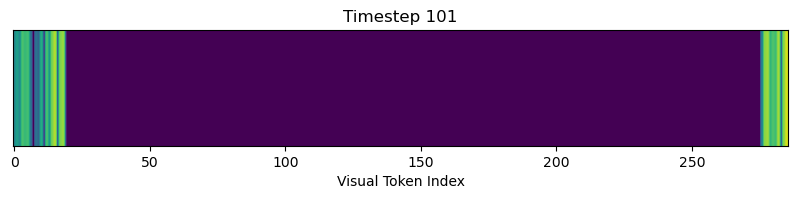

In [6]:
from matplotlib import colors

fig, ax = plt.subplots(figsize=(10, 1.5))  # Wide, short figure
heatmap = ax.imshow(layer1_flattened[0].reshape(1, -1), aspect='auto', cmap='viridis',  norm=colors.LogNorm()) #vmin=layer1_flattened.min(), vmax=layer1_flattened.max()
ax.set_yticks([])
ax.set_xlabel("Visual Token Index")

def update(t):
    heatmap.set_array(layer1_flattened[t].reshape(1, -1))
    ax.set_title(f"Timestep {t}")
    return [heatmap]

ani = FuncAnimation(fig, update, frames=range(layer1_flattened.shape[0]), blit=True)
HTML(ani.to_jshtml())

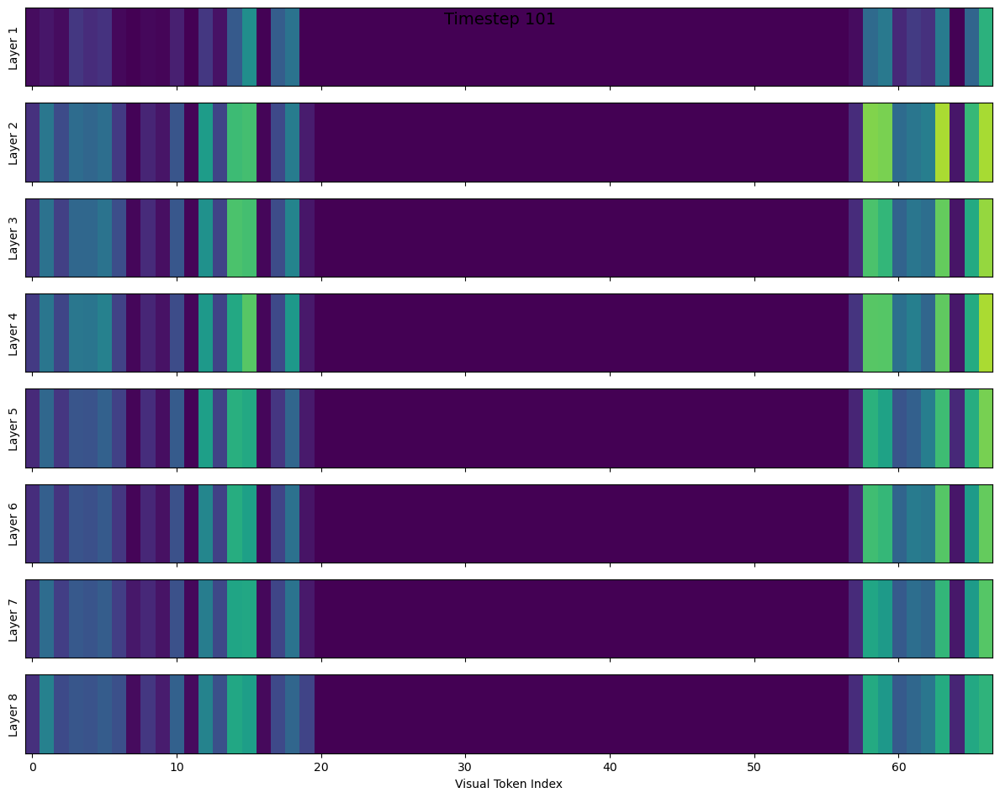

In [7]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import display, HTML

# --- CONFIGURATION ---
num_layers = 8
focus_indices = list(range(0, 41)) + list(range(260, 286))  # Tokens 0–40 and 260–286
timesteps = layer_outputs[0].shape[0]

# Slice each layer's tensor to only focus on selected tokens
focused_layers = [layer[:, focus_indices].to(dtype=torch.float32) for layer in layer_outputs]

# --- PLOTTING ---
fig, axes = plt.subplots(num_layers, 1, figsize=(12, num_layers * 1.2), sharex=True)
heatmaps = []

for i in range(num_layers):
    ax = axes[i]
    data = focused_layers[i][0].reshape(1, -1)
    hm = ax.imshow(data, aspect='auto', cmap='viridis',
                   interpolation='nearest',
                   vmin=focused_layers[i].min(),
                   vmax=focused_layers[i].max())
    ax.set_yticks([])
    ax.set_ylabel(f"Layer {i+1}")
    heatmaps.append(hm)

axes[-1].set_xlabel("Visual Token Index")
fig.tight_layout()

def update(t):
    for i in range(num_layers):
        heatmaps[i].set_array(focused_layers[i][t].reshape(1, -1))
    fig.suptitle(f"Timestep {t}", fontsize=14)
    return heatmaps

ani = FuncAnimation(fig, update, frames=timesteps, interval=200, blit=True, repeat=True)

display(HTML(ani.to_jshtml()))

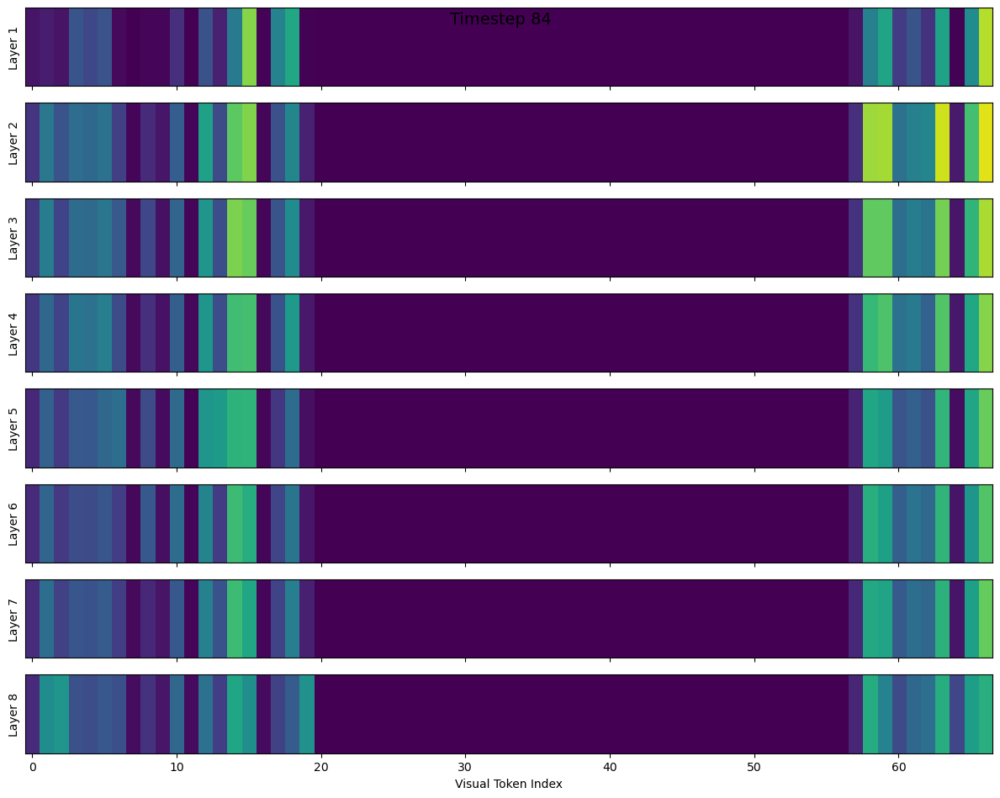

In [8]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import display, HTML

num_layers = 8
focus_indices = list(range(0, 41)) + list(range(260, 286))  # Tokens 0–40 and 260–286
timesteps = layer_outputs_grabbing[0].shape[0]

# Slice each layer's tensor to only focus on selected tokens
focused_layers = [layer[:, focus_indices].to(dtype=torch.float32) for layer in layer_outputs_grabbing]

# --- PLOTTING ---
fig, axes = plt.subplots(num_layers, 1, figsize=(12, num_layers * 1.2), sharex=True)
heatmaps = []

for i in range(num_layers):
    ax = axes[i]
    data = focused_layers[i][0].reshape(1, -1)
    hm = ax.imshow(data, aspect='auto', cmap='viridis',
                   interpolation='nearest',
                   vmin=focused_layers[i].min(),
                   vmax=focused_layers[i].max())
    ax.set_yticks([])
    ax.set_ylabel(f"Layer {i+1}")
    heatmaps.append(hm)

axes[-1].set_xlabel("Visual Token Index")
fig.tight_layout()

def update(t):
    for i in range(num_layers):
        heatmaps[i].set_array(focused_layers[i][t].reshape(1, -1))
    fig.suptitle(f"Timestep {t}", fontsize=14)
    return heatmaps

ani = FuncAnimation(fig, update, frames=timesteps, interval=200, blit=True, repeat=True)

# Use display() instead of returning HTML directly to avoid static frame
display(HTML(ani.to_jshtml()))


### Layer Analysis: Grabbing vs Reaching
In this first analysis I will investigate whether and how the grabbing and the reaching motions look when picking up the ball. For this, we first see which tokens are activated at all in each of the 8 layers.

In [9]:
# we basically have 102 timesteps each time
abs_sum = layer1_flattened.abs().sum(dim=0)  
print(abs_sum)
always_zero = abs_sum <= 2.4e-3 #This is approximately the largest value I see here that is not relevant layers
zero_token_indices = torch.nonzero(always_zero, as_tuple=True)[0]
activated =layer1_flattened[:, always_zero.logical_not()]
activated.shape

tensor([1.0459e+00, 1.4592e+00, 1.3369e+00, 3.4478e+00, 2.8227e+00, 3.2683e+00,
        1.0010e+00, 5.0838e-01, 7.3235e-01, 4.0198e-01, 1.3451e+00, 1.5340e-01,
        3.2679e+00, 1.5604e+00, 5.6247e+00, 9.8126e+00, 1.9235e-01, 5.7733e+00,
        6.7317e+00, 7.9844e-01, 2.9446e-03, 2.7640e-03, 2.6484e-03, 2.5963e-03,
        2.5275e-03, 2.4783e-03, 2.4573e-03, 2.4394e-03, 2.4280e-03, 2.4225e-03,
        2.4076e-03, 2.4044e-03, 2.3994e-03, 2.3963e-03, 2.3982e-03, 2.4008e-03,
        2.3931e-03, 2.3989e-03, 2.4082e-03, 2.4166e-03, 2.4079e-03, 2.3949e-03,
        2.3953e-03, 2.3974e-03, 2.3869e-03, 2.3795e-03, 2.3877e-03, 2.3783e-03,
        2.3827e-03, 2.3716e-03, 2.3737e-03, 2.3801e-03, 2.3750e-03, 2.3859e-03,
        2.3722e-03, 2.3682e-03, 2.3765e-03, 2.3645e-03, 2.3624e-03, 2.3671e-03,
        2.3642e-03, 2.3630e-03, 2.3681e-03, 2.3599e-03, 2.3648e-03, 2.3662e-03,
        2.3616e-03, 2.3600e-03, 2.3650e-03, 2.3542e-03, 2.3617e-03, 2.3540e-03,
        2.3566e-03, 2.3564e-03, 2.3555e-

torch.Size([102, 46])

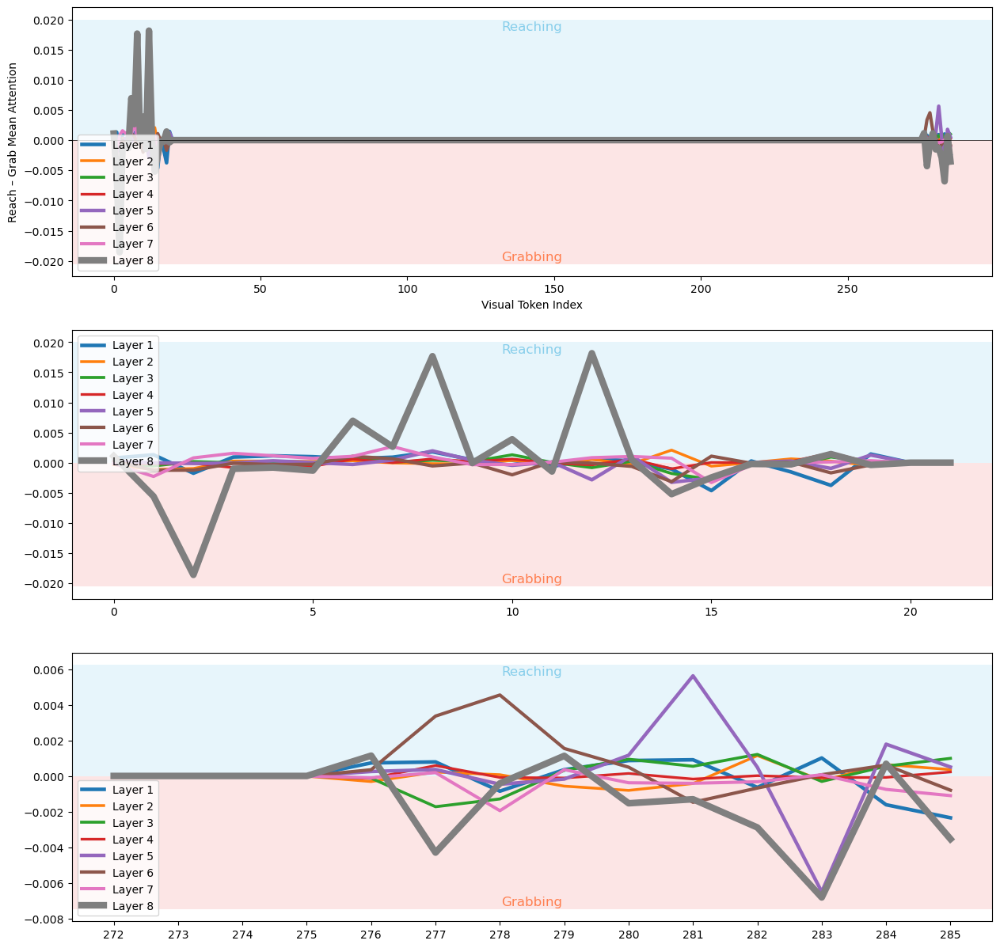

In [10]:
#I now take an average for reaching and an average for grabbing and want to compare the two
#Here we investiagate the differences per layer
fig, (ax1, ax2, ax3) =plt.subplots(3, 1, figsize=(15, 15)) 


reach_mean_layer1=torch.mean(layer1_flattened, dim=0)
grab_mean_layer1=torch.mean(layer1_flattened_grabbing, dim=0)

reach_mean_layer2=torch.mean(layer2_flattened, dim=0)
grab_mean_layer2=torch.mean(layer2_flattened_grabbing, dim=0)

reach_mean_layer3=torch.mean(layer3_flattened, dim=0)
grab_mean_layer3=torch.mean(layer3_flattened_grabbing, dim=0)

reach_mean_layer4=torch.mean(layer4_flattened, dim=0)
grab_mean_layer4=torch.mean(layer4_flattened_grabbing, dim=0)

reach_mean_layer5=torch.mean(layer5_flattened, dim=0)
grab_mean_layer5=torch.mean(layer5_flattened_grabbing, dim=0)

reach_mean_layer6=torch.mean(layer6_flattened, dim=0)
grab_mean_layer6=torch.mean(layer6_flattened_grabbing, dim=0)

reach_mean_layer7=torch.mean(layer7_flattened, dim=0)
grab_mean_layer7=torch.mean(layer7_flattened_grabbing, dim=0)

reach_mean_layer8=torch.mean(layer8_flattened, dim=0)
grab_mean_layer8=torch.mean(layer8_flattened_grabbing, dim=0)


difference_layer1=reach_mean_layer1-grab_mean_layer1
difference_layer2=reach_mean_layer2-grab_mean_layer2
difference_layer3=reach_mean_layer3-grab_mean_layer3
difference_layer4=reach_mean_layer4-grab_mean_layer4
difference_layer5=reach_mean_layer5-grab_mean_layer5
difference_layer6=reach_mean_layer6-grab_mean_layer6
difference_layer7=reach_mean_layer7-grab_mean_layer7
difference_layer8=reach_mean_layer8-grab_mean_layer8

layers = [difference_layer1, difference_layer2, difference_layer3,
          difference_layer4, difference_layer5, difference_layer6,
          difference_layer7, difference_layer8]


line_widths = [2 + 4 * (np.abs(layer).sum() / max(abs(layer_i).sum() for layer_i in layers)) for layer in layers]

for idx, layer in enumerate(layers):
    lw = line_widths[idx]
    ax1.plot(range(286), layer, label=f"Layer {idx+1}", linewidth=lw)

ax1.axhline(0, color='black', linewidth=0.5)
ax1.legend()
ax1.set_xlabel("Visual Token Index")
ax1.set_ylabel("Reach – Grab Mean Attention")
ax1.axhspan(0, ax1.get_ylim()[1], facecolor='skyblue', alpha=0.2)
ax1.axhspan(ax1.get_ylim()[0], 0, facecolor='lightcoral', alpha=0.2)

ax1.text(0.5, 0.95, 'Reaching', ha='center', va='top', transform=ax1.transAxes, fontsize=12, color="skyblue")
ax1.text(0.5, 0.05, 'Grabbing', ha='center', va='bottom', transform=ax1.transAxes, fontsize=12, color="coral")
ax1.legend()


#We see that there are no differences in the middle but mostly on the left and right hand side, so we investigate them more in detail
cuttoff_left=22
for idx, layer in enumerate(layers):
    lw = line_widths[idx]
    ax2.plot(range(cuttoff_left), layer[:cuttoff_left], label=f"Layer {idx+1}", linewidth=lw)
    
ax2.axhspan(0, ax2.get_ylim()[1], facecolor='skyblue', alpha=0.2)
ax2.axhspan(ax2.get_ylim()[0], 0, facecolor='lightcoral', alpha=0.2)
ax2.text(0.5, 0.95, 'Reaching', ha='center', va='top', transform=ax2.transAxes, fontsize=12, color="skyblue")
ax2.text(0.5, 0.05, 'Grabbing', ha='center', va='bottom', transform=ax2.transAxes, fontsize=12, color="coral")
ax2.legend()


cuttoff_right=272
for idx, layer in enumerate(layers):
    lw = line_widths[idx]
    ax3.plot(range(286-cuttoff_right), layer[cuttoff_right:], label=f"Layer {idx+1}", linewidth=lw)
ax3.set_xticks(range(286-cuttoff_right))
ax3.set_xticklabels(range(cuttoff_right, 286))

ax3.axhspan(0, ax3.get_ylim()[1], facecolor='skyblue', alpha=0.2)
ax3.axhspan(ax3.get_ylim()[0], 0, facecolor='lightcoral', alpha=0.2)
ax3.text(0.5, 0.95, 'Reaching', ha='center', va='top', transform=ax3.transAxes, fontsize=12, color="skyblue")
ax3.text(0.5, 0.05, 'Grabbing', ha='center', va='bottom', transform=ax3.transAxes, fontsize=12, color="coral")
ax3.legend()

From the above analysis we can see many of the tokens do not influence the reaching and grabbing motions at all in any layers. Layer 8 in total has the largest differences, meaning its the most decisive, which makes sense, since it is at the end. Additionally, layer 5 and 1 are important, followed by layer 6, 7 and 1. Layer 2 and 4 are the least important.

In the following I want to look at which tokens are more in reaching and which are more in grabbing.

I will also firstly focus a bit more on layer 8 since it has the largest differences and maybe has the most interesting outputs.

C:\Users\kulma\AppData\Local\Temp\ipykernel_34612\2349556589.py:73: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


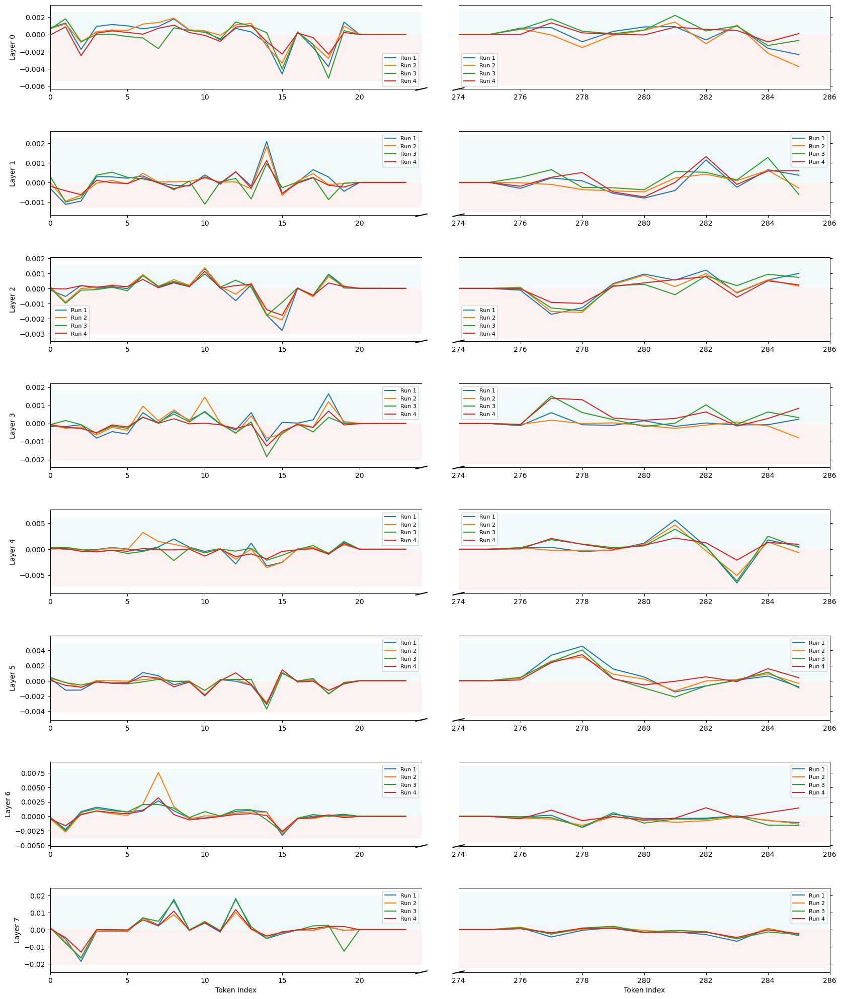

In [11]:
#I will now check the consistency of the above results and compare them to other instances of successfull grabbing and reaching.
#To do this, I will plott layer 8 for all instances in one plot

#In total, we have about 8 usable other instances. I will download them and then perform the analysis here for layer 8
def create_layers(selected_motion):
    layer1_flattened=torch.mean(torch.concatenate([el[0].mean(dim=0) for el in selected_motion]).to(torch.float32), dim=0)
    layer2_flattened=torch.mean(torch.concatenate([el[1].mean(dim=0) for el in selected_motion]).to(torch.float32), dim=0)
    layer3_flattened=torch.mean(torch.concatenate([el[2].mean(dim=0) for el in selected_motion]).to(torch.float32), dim=0)
    layer4_flattened=torch.mean(torch.concatenate([el[3].mean(dim=0) for el in selected_motion]).to(torch.float32), dim=0)
    layer5_flattened=torch.mean(torch.concatenate([el[4].mean(dim=0) for el in selected_motion]).to(torch.float32), dim=0)
    layer6_flattened=torch.mean(torch.concatenate([el[5].mean(dim=0) for el in selected_motion]).to(torch.float32), dim=0)
    layer7_flattened=torch.mean(torch.concatenate([el[6].mean(dim=0) for el in selected_motion]).to(torch.float32), dim=0)
    layer8_flattened=torch.mean(torch.concatenate([el[7].mean(dim=0) for el in selected_motion]).to(torch.float32), dim=0)
    return layer1_flattened, layer2_flattened, layer3_flattened, layer4_flattened, layer5_flattened, layer6_flattened, layer7_flattened, layer8_flattened

def plot_whole_layer_overlap(list_of_diffs):
    fig, ax=plt.subplots(8, 1, figsize=(25, 20)) #I plot layer wise to compare the different outputs and I hope they are all similar

    for i in range(8): #We first iterate over each layer
        layers=[el[i] for el in list_of_diffs]
        labels=["Variation "+ str(r) for r in range(len(layers))]
        
        for idx, variaton in enumerate(layers):
            ax[i].plot(range(286), variaton, label=f"Label for Run {idx+1}")
            
            ax[i].axhspan(0, ax[i].get_ylim()[1], facecolor='skyblue', alpha=0.2)
            ax[i].axhspan(ax[i].get_ylim()[0], 0, facecolor='lightcoral', alpha=0.2)
            ax[i].text(0.5, 0.95, 'Reaching', ha='center', va='top', transform=ax[i].transAxes, fontsize=12, color="skyblue")
            ax[i].text(0.5, 0.05, 'Grabbing', ha='center', va='bottom', transform=ax[i].transAxes, fontsize=12, color="coral")
            
            ax[i].set_title(f"Layer {i}")
            ax[i].legend()
            
def plot_whole_layer_overlap_broken_axis(list_of_diffs, token_cut_start=20, token_cut_end=260):
    fig, axes = plt.subplots(8, 2, figsize=(20, 25), sharey='row',
                             gridspec_kw={'width_ratios': [1, 1], 'hspace': 0.5, 'wspace': 0.1})

    for i in range(8):  # for each layer
        layers = [el[i] for el in list_of_diffs]
        
        for idx, variation in enumerate(layers):
            variation = variation.numpy() 
            
            axes[i, 0].plot(range(0, token_cut_start), variation[:token_cut_start], label=f"Run {idx+1}")
            axes[i, 0].set_xlim(0, token_cut_start)
            
            
            axes[i, 1].plot(range(token_cut_end, 286), variation[token_cut_end:], label=f"Run {idx+1}")
            axes[i, 1].set_xlim(token_cut_end, 286)
        
        for j in [0, 1]:
            ax = axes[i, j]
            ax.axhspan(0, ax.get_ylim()[1], facecolor='skyblue', alpha=0.1)
            ax.axhspan(ax.get_ylim()[0], 0, facecolor='lightcoral', alpha=0.1)
            if j == 0:
                ax.set_ylabel(f"Layer {i}")
                ax.spines['right'].set_visible(False)
                ax.yaxis.tick_left()
            if j==1:
                ax.spines['left'].set_visible(False)
                ax.yaxis.tick_right()
            if i == 7:
                ax.set_xlabel("Token Index")
            ax.legend(fontsize=8)

        
        d = 0.015
        kwargs = dict(transform=axes[i, 0].transAxes, color='k', clip_on=False)
        axes[i, 0].plot((1 - d, 1 + d), (-d, +d), **kwargs)
        kwargs['transform'] = axes[i, 1].transAxes
        axes[i, 1].plot((-d, +d), (-d, +d), **kwargs)

    plt.tight_layout()
    plt.show()


def create_difference(filenames, reach_grab_limits):
    all_layer_differences=[]
    
    for idx, f in enumerate(filenames):
        output_matrix=torch.load("./pick_up_ball_data/small/red/"+f, map_location=torch.device('cpu'))
        all_cross_attentions=extract_cross_attentions(output_matrix)
        reaching=all_cross_attentions[:reach_grab_limits[idx][0]]
        grabbing=all_cross_attentions[reach_grab_limits[idx][0]:reach_grab_limits[idx][1]]
        
        layer1_reaching, layer2_reaching, layer3_reaching, layer4_reaching, layer5_reaching, layer6_reaching, layer7_reaching, layer8_reaching=create_layers(reaching)
        layer1_grabbing, layer2_grabbing, layer3_grabbing, layer4_grabbing, layer5_grabbing, layer6_grabbing, layer7_grabbing, layer8_grabbing=create_layers(grabbing)
        
        diff_layer1=layer1_reaching-layer1_grabbing
        diff_layer2=layer2_reaching-layer2_grabbing
        diff_layer3=layer3_reaching-layer3_grabbing
        diff_layer4=layer4_reaching-layer4_grabbing
        diff_layer5=layer5_reaching-layer5_grabbing
        diff_layer6=layer6_reaching-layer6_grabbing
        diff_layer7=layer7_reaching-layer7_grabbing
        diff_layer8=layer8_reaching-layer8_grabbing
        layers = [diff_layer1, diff_layer2, diff_layer3, diff_layer4, diff_layer5, diff_layer6, diff_layer7, diff_layer8]
        all_layer_differences.append(layers)
    
    #plot_whole_layer_overlap(all_layer_differences)
    plot_whole_layer_overlap_broken_axis(all_layer_differences, token_cut_start=24, token_cut_end=274)
    return all_layer_differences

filenames=["0ec0d9a9-52f2-4a00-8bb8-b2265616a6ca_attentions.pt", 
           "4d13cbfc-d8c8-4770-a1e4-8f064302cfdb_attentions.pt",
           "71ce7b2b-4960-4a2b-95dd-0902c5bdcd76_attentions.pt",
           "79357f5f-063e-4eb3-a24a-a0155bce34af_attentions.pt"]

reach_grab_limits=[[6, 11], 
                   [6, 11],
                   [5, 11],
                   [5, 11]]
all_layer_differences=create_difference(filenames, reach_grab_limits)     

The above plots show an overlap between the different runs, showing that attention patterns are not noise but actually usable.

Next, we will look at the tokens that are more positive for reaching and those that are more correlated/activated to grabbing

In [12]:
#Here we analyse whether my visual checks from above are actually significant or not. Kruskal indicates that yes, indeed, they are (across layers)
#Additionally, the standard devaition is also tiny, so this is all a good sign and shows consistency across runs!

from scipy.stats import kruskal

num_runs = len(all_layer_differences)
num_layers = len(all_layer_differences[0])
num_tokens = len(all_layer_differences[0][0])
print("Num runs: ", num_runs, "\nNum layer: ", num_layers, "\nNum tokens: ", num_tokens) 
# Store p-values: shape [num_layers, num_tokens]
p_values = np.zeros((num_layers, num_tokens))

for layer_idx in range(num_layers):
    #for token_idx in range(num_tokens):
        # Extract the values at this layer/token across all runs
    values = [all_layer_differences[run_idx][layer_idx] for run_idx in range(num_runs)]
    #print("Values shape: ", len(values))
    #print("Values: ", values)
    _, p = kruskal(*values)
    print("Kruskal results: ", p)
        
    p_values[layer_idx] = p
        
#print(p_values)

#for layer_idx in range(num_layers):
#    for token_idx in range(num_tokens):
#        var = token_variances[layer_idx, token_idx]
#        if var > 1:  # suspiciously high
#            print(f"High variance at layer {layer_idx}, token {token_idx}: {var}")
#            values = [
#                all_layer_differences[run_idx][layer_idx][token_idx].item()
#                for run_idx in range(num_runs)
#            ]
#            print("Values:", values)

#sns.heatmap(token_variances)

Num runs:  4 
Num layer:  8 
Num tokens:  286
Kruskal results:  4.984441647062221e-148
Kruskal results:  1.234356472485197e-151
Kruskal results:  4.9000181048719705e-148
Kruskal results:  3.833858682945042e-149
Kruskal results:  9.489964433043954e-144
Kruskal results:  4.457070045556412e-148
Kruskal results:  4.473350523140433e-150
Kruskal results:  6.146110823777293e-147


NameError: name 'token_variances' is not defined

torch.Size([8, 286])
Threshold:  tensor(0.)
reching tokens:  [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 12, 13, 16, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 2

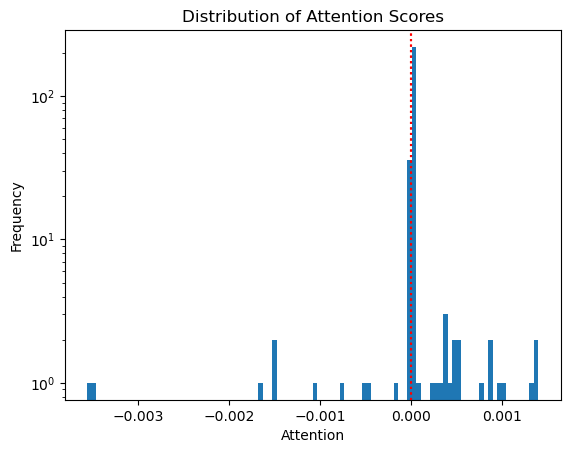

Kepts tokens:  tensor([ 4.9932e-04,  1.3115e-03, -1.4821e-03,  3.5409e-04,  5.2886e-04,
         3.6891e-04,  3.7549e-04,  3.4500e-04,  1.3942e-03,  4.3356e-04,
         2.4496e-04, -5.0989e-04,  1.0332e-03,  8.9277e-04, -7.6082e-04,
        -3.5640e-03,  2.5494e-04, -1.0446e-03, -3.4795e-03,  7.7285e-04,
         7.8385e-06,  7.5079e-06,  7.0877e-06,  6.9426e-06,  6.7447e-06,
         6.5880e-06,  6.5214e-06,  6.4155e-06,  6.4061e-06,  6.3568e-06,
         6.2240e-06,  6.2550e-06,  6.2320e-06,  6.1913e-06,  6.1468e-06,
         6.1457e-06,  6.1067e-06,  6.1772e-06,  6.1974e-06,  6.1925e-06,
         6.1449e-06,  6.1128e-06,  6.0985e-06,  6.1426e-06,  6.1253e-06,
         6.0617e-06,  6.0736e-06,  6.0255e-06,  6.0652e-06,  6.0426e-06,
         6.0543e-06,  6.0655e-06,  6.0413e-06,  6.0111e-06,  5.9725e-06,
         6.0248e-06,  6.0421e-06,  6.0193e-06,  5.9833e-06,  5.9829e-06,
         5.9679e-06,  5.9392e-06,  5.9901e-06,  5.9607e-06,  5.9372e-06,
         5.9745e-06,  5.9804e-06,  5

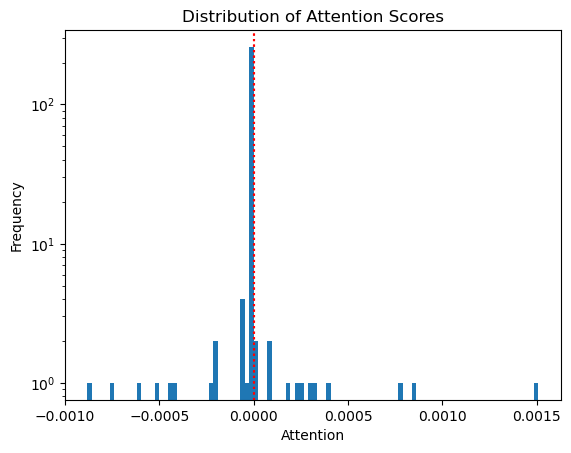

Kepts tokens:  tensor([-4.7033e-05, -8.8214e-04, -7.6132e-04,  1.8125e-04,  2.2224e-04,
         8.4910e-05,  3.0212e-04, -3.9606e-06, -2.0369e-04, -5.1289e-05,
        -5.6188e-05, -2.1400e-05,  3.2803e-04, -4.1211e-04,  1.5063e-03,
        -5.2131e-04,  1.8991e-05,  4.0086e-04, -2.1554e-04, -1.9910e-04,
        -2.4794e-06, -2.3336e-06, -2.5697e-06, -2.5585e-06, -2.4105e-06,
        -2.3715e-06, -2.3028e-06, -2.3049e-06, -2.2572e-06, -2.2313e-06,
        -2.3124e-06, -2.1876e-06, -2.2432e-06, -2.1843e-06, -2.2384e-06,
        -2.2258e-06, -2.2479e-06, -2.1489e-06, -2.0983e-06, -2.1751e-06,
        -2.1612e-06, -2.1308e-06, -2.2198e-06, -2.0996e-06, -2.1459e-06,
        -2.1794e-06, -2.1690e-06, -2.2201e-06, -2.1451e-06, -2.1772e-06,
        -2.1524e-06, -2.2017e-06, -2.1585e-06, -2.1601e-06, -2.2088e-06,
        -2.1648e-06, -2.1267e-06, -2.1066e-06, -2.1958e-06, -2.1214e-06,
        -2.1128e-06, -2.2026e-06, -2.0476e-06, -2.0867e-06, -2.0842e-06,
        -2.0829e-06, -2.0979e-06, -2

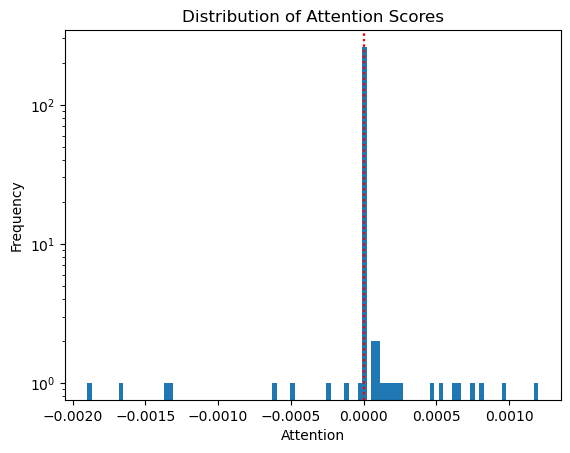

Kepts tokens:  tensor([ 1.2147e-05, -6.1705e-04,  6.3459e-05,  2.0226e-05,  1.4523e-04,
         1.3703e-05,  8.0587e-04,  1.0982e-04,  4.5996e-04,  1.6699e-04,
         1.1995e-03,  6.5818e-05, -1.1333e-04,  2.3897e-04, -1.6780e-03,
        -1.9006e-03,  1.6237e-05, -4.8631e-04,  7.5360e-04,  1.0754e-04,
         3.2320e-06,  3.1614e-06,  2.6594e-06,  2.4617e-06,  2.4214e-06,
         2.2530e-06,  2.2211e-06,  2.1844e-06,  2.1936e-06,  2.1571e-06,
         2.0064e-06,  2.0919e-06,  2.0559e-06,  2.0666e-06,  1.9979e-06,
         2.0015e-06,  1.9584e-06,  2.0757e-06,  2.1519e-06,  2.0989e-06,
         2.0554e-06,  2.0430e-06,  1.8941e-06,  1.9833e-06,  1.9445e-06,
         1.8645e-06,  1.9303e-06,  1.8567e-06,  1.9329e-06,  1.8416e-06,
         1.8630e-06,  1.8195e-06,  1.8309e-06,  1.8396e-06,  1.7635e-06,
         1.7912e-06,  1.8249e-06,  1.7947e-06,  1.7488e-06,  1.7724e-06,
         1.7379e-06,  1.6700e-06,  1.8381e-06,  1.7748e-06,  1.7768e-06,
         1.7833e-06,  1.7729e-06,  1

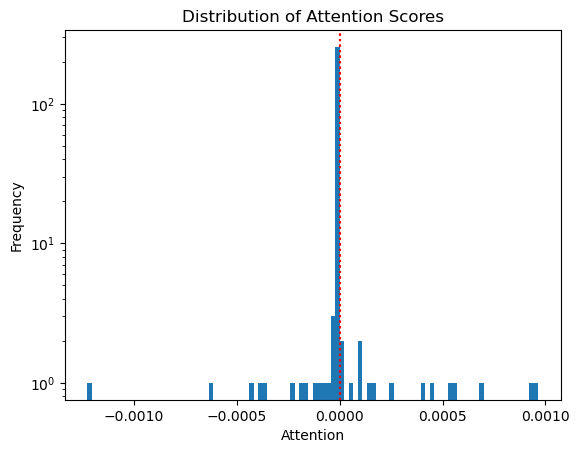

Kepts tokens:  tensor([-9.7656e-05, -1.2530e-04, -1.5349e-04, -6.3166e-04, -2.2733e-04,
        -3.5903e-04,  5.5584e-04,  6.1607e-05,  5.4330e-04,  9.1134e-05,
         6.8976e-04, -3.0516e-05, -4.3167e-04,  2.6167e-04, -1.2269e-03,
        -3.7638e-04, -2.2768e-05, -1.7760e-04,  9.6400e-04,  9.6491e-06,
        -7.9293e-06, -6.8987e-06, -6.6758e-06, -6.3393e-06, -5.9583e-06,
        -5.8863e-06, -5.7734e-06, -5.6910e-06, -5.5669e-06, -5.4989e-06,
        -5.6890e-06, -5.4285e-06, -5.4323e-06, -5.3932e-06, -5.4792e-06,
        -5.3985e-06, -5.5394e-06, -5.3427e-06, -5.2567e-06, -5.2845e-06,
        -5.3356e-06, -5.2591e-06, -5.4452e-06, -5.2356e-06, -5.2627e-06,
        -5.3589e-06, -5.3043e-06, -5.3671e-06, -5.2088e-06, -5.3595e-06,
        -5.2609e-06, -5.3570e-06, -5.3056e-06, -5.2399e-06, -5.2901e-06,
        -5.2028e-06, -5.2541e-06, -5.2367e-06, -5.3229e-06, -5.1191e-06,
        -5.1998e-06, -5.3307e-06, -5.0253e-06, -5.1154e-06, -5.1046e-06,
        -5.1081e-06, -5.1130e-06, -5

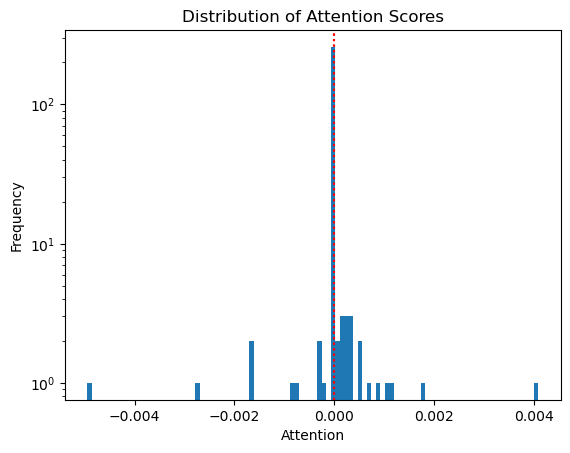

Kepts tokens:  tensor([ 2.1817e-04,  1.6276e-04, -1.6943e-04, -3.2163e-04,  5.0743e-05,
        -3.1523e-04,  6.7037e-04,  5.3733e-04,  1.4789e-04,  2.3949e-04,
        -7.8263e-04,  7.6119e-05, -1.6350e-03,  1.1734e-04, -2.6932e-03,
        -1.6611e-03, -1.2114e-05,  3.5299e-04, -8.5108e-04,  1.1834e-03,
         3.7030e-06,  3.5418e-06,  3.2569e-06,  3.1169e-06,  3.0054e-06,
         2.8840e-06,  2.7784e-06,  2.7582e-06,  2.7175e-06,  2.6663e-06,
         2.5868e-06,  2.5792e-06,  2.5706e-06,  2.5391e-06,  2.4932e-06,
         2.4925e-06,  2.4306e-06,  2.4464e-06,  2.5181e-06,  2.4961e-06,
         2.4703e-06,  2.4126e-06,  2.3710e-06,  2.3947e-06,  2.3823e-06,
         2.3384e-06,  2.3481e-06,  2.2848e-06,  2.3204e-06,  2.2655e-06,
         2.2703e-06,  2.2450e-06,  2.2568e-06,  2.2765e-06,  2.2446e-06,
         2.2276e-06,  2.2255e-06,  2.2538e-06,  2.2151e-06,  2.2260e-06,
         2.2037e-06,  2.1335e-06,  2.2429e-06,  2.2052e-06,  2.2094e-06,
         2.2113e-06,  2.1930e-06,  2

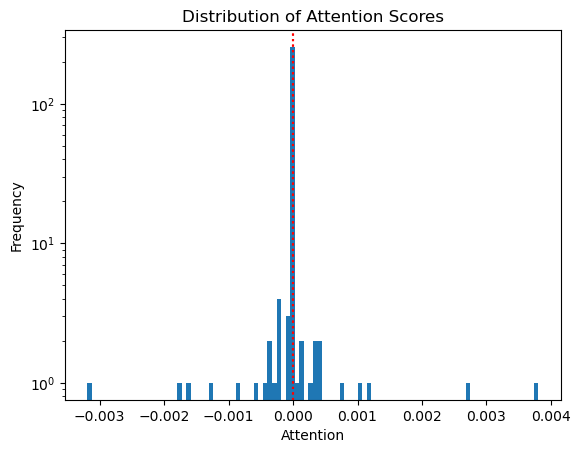

Kepts tokens:  tensor([ 2.9581e-04, -5.7493e-04, -8.7615e-04, -8.7124e-05, -2.3762e-04,
        -2.5593e-04,  4.2309e-04,  3.8481e-04, -3.7184e-04, -8.1844e-05,
        -1.7666e-03,  1.0586e-04,  3.4072e-04, -3.4928e-04, -3.1942e-03,
         1.1429e-03, -8.7487e-05,  1.0220e-04, -1.5937e-03, -3.0370e-04,
        -2.3512e-07,  2.6075e-07,  4.2043e-07,  5.8663e-07,  8.0529e-07,
         9.0393e-07,  1.0251e-06,  1.1216e-06,  1.1645e-06,  1.2060e-06,
         1.1596e-06,  1.2824e-06,  1.3386e-06,  1.4139e-06,  1.3527e-06,
         1.3756e-06,  1.3744e-06,  1.4636e-06,  1.5734e-06,  1.5344e-06,
         1.5694e-06,  1.5496e-06,  1.4485e-06,  1.5509e-06,  1.5433e-06,
         1.4953e-06,  1.5304e-06,  1.4878e-06,  1.5353e-06,  1.4737e-06,
         1.4680e-06,  1.4665e-06,  1.4898e-06,  1.5295e-06,  1.4891e-06,
         1.5121e-06,  1.5497e-06,  1.5645e-06,  1.5371e-06,  1.5606e-06,
         1.5423e-06,  1.4698e-06,  1.6018e-06,  1.6228e-06,  1.5909e-06,
         1.5590e-06,  1.5849e-06,  1

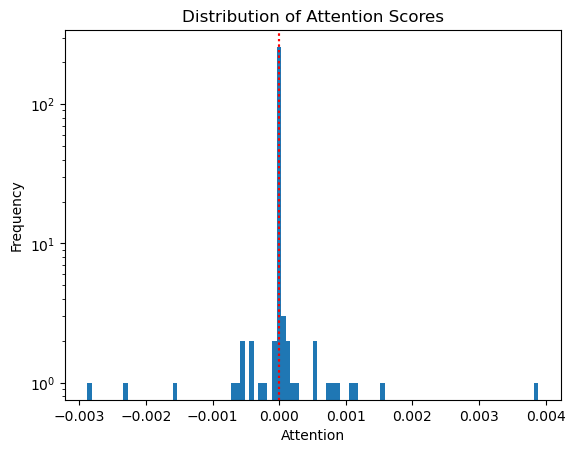

Kepts tokens:  tensor([-2.7912e-04, -2.2829e-03,  5.4674e-04,  1.1775e-03,  8.0949e-04,
         5.2059e-04,  1.5285e-03,  3.8859e-03,  1.0980e-03, -4.1351e-04,
         6.5642e-05,  3.1943e-05,  7.1794e-04,  8.5204e-04,  2.5204e-04,
        -2.8849e-03, -3.8528e-04, -7.5636e-05,  1.2757e-04,  8.9855e-05,
        -6.7088e-06, -6.2987e-06, -6.2225e-06, -6.2585e-06, -6.0698e-06,
        -5.9399e-06, -6.0062e-06, -5.9307e-06, -5.9080e-06, -5.8555e-06,
        -5.9505e-06, -5.7270e-06, -5.7411e-06, -5.7310e-06, -5.7821e-06,
        -5.7681e-06, -5.7695e-06, -5.6396e-06, -5.5359e-06, -5.6609e-06,
        -5.6394e-06, -5.6913e-06, -5.7992e-06, -5.6632e-06, -5.6583e-06,
        -5.7242e-06, -5.7037e-06, -5.7109e-06, -5.6590e-06, -5.6910e-06,
        -5.7050e-06, -5.8080e-06, -5.7912e-06, -5.8105e-06, -5.7888e-06,
        -5.8222e-06, -5.8282e-06, -5.7494e-06, -5.8391e-06, -5.8421e-06,
        -5.8314e-06, -6.0367e-06, -5.7670e-06, -5.8048e-06, -5.7859e-06,
        -5.8778e-06, -5.8547e-06, -5

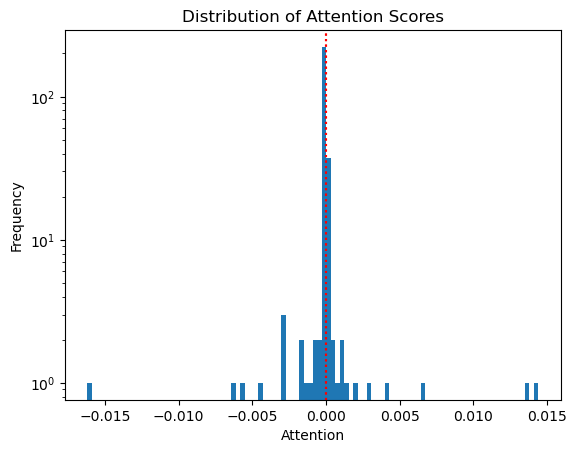

Kepts tokens:  tensor([ 1.0452e-03, -6.3605e-03, -1.6209e-02, -4.5770e-04, -3.6675e-04,
        -6.9754e-04,  6.5794e-03,  3.0012e-03,  1.3508e-02, -2.1410e-04,
         4.1951e-03, -8.8188e-04,  1.4386e-02,  6.9652e-04, -4.4910e-03,
        -1.7083e-03, -1.7617e-04,  5.2640e-04,  1.8964e-03, -2.9017e-03,
         8.5419e-06,  8.4076e-06,  7.6407e-06,  6.9702e-06,  6.9334e-06,
         7.0812e-06,  7.1474e-06,  7.3336e-06,  7.4800e-06,  7.0896e-06,
         6.3553e-06,  6.5944e-06,  6.7187e-06,  6.7545e-06,  6.8233e-06,
         6.5233e-06,  6.4346e-06,  6.6994e-06,  6.8812e-06,  7.2111e-06,
         7.1213e-06,  6.9030e-06,  6.7034e-06,  6.5211e-06,  6.5893e-06,
         6.0871e-06,  6.3110e-06,  6.1113e-06,  6.5390e-06,  5.9679e-06,
         6.3087e-06,  6.2103e-06,  6.0362e-06,  6.1576e-06,  6.0595e-06,
         5.9285e-06,  5.9911e-06,  5.8235e-06,  5.9071e-06,  6.0534e-06,
         5.7933e-06,  5.7867e-06,  6.0181e-06,  6.1544e-06,  6.2971e-06,
         6.3025e-06,  5.9969e-06,  6

In [13]:
#Tokens that are more needed for reaching vs for grabbing
#I look at the tokens that are thee least variable in terms of tendencies

all_torch_stacks=torch.mean(torch.stack([torch.stack(el) for el in all_layer_differences]), dim=0)

print(all_torch_stacks.shape)

all_reaching_tokens=[]
all_grabbing_tokens=[]
all_layer_infos=[]
#thresh= 0.001
for meaned_layer in all_torch_stacks:
    min_value=min(meaned_layer)
    max_value=max(meaned_layer)
    
    dynamic_range = max_value - min_value
    thresh = 0.0 * dynamic_range
    print("Threshold: ", thresh)
    #print("Any zeros in meaned layer? ", torch.any(meaned_layer))
    
    mask = meaned_layer.abs() >= thresh
    sig= meaned_layer[mask==True]
    all_layer_infos.append(sig)
    
    reaching_tokens=[el for el in range(len(meaned_layer[mask==True])) if meaned_layer[mask==True][el] >= 0.0]
    all_reaching_tokens.append(reaching_tokens)
    grabbing_tokens=[el for el in range(len(meaned_layer[mask==True])) if meaned_layer[mask==True][el] < 0.0]
    all_grabbing_tokens.append(grabbing_tokens)
    
    print("reching tokens: ", reaching_tokens)
    print("grabbing tokens: ", grabbing_tokens)

    plt.hist(meaned_layer.numpy(), bins=100)
    
    plt.axvline(thresh, color="red", linestyle=":")
    plt.axvline(-thresh, color="red", linestyle=":")
    
    plt.title("Distribution of Attention Scores")
    plt.xlabel("Attention")
    plt.ylabel("Frequency")
    plt.yscale('log')
    plt.show()    
        
    print("Kepts tokens: ", sig)
    print("Negative tokens (Grabbing): ", len([el for el in sig if el <0]))
    print("Positive tokens (Reaching): ", len([el for el in sig if el >0]))
    print(f"Threshold {thresh}: {len(sig)} tokens retained")


[Text(0.5, 0, '0'),
 Text(1.5, 0, '1'),
 Text(2.5, 0, '2'),
 Text(3.5, 0, '3'),
 Text(4.5, 0, '4'),
 Text(5.5, 0, '5'),
 Text(6.5, 0, '6'),
 Text(7.5, 0, '7'),
 Text(8.5, 0, '8'),
 Text(9.5, 0, '9'),
 Text(10.5, 0, '10'),
 Text(11.5, 0, '11'),
 Text(12.5, 0, '12'),
 Text(13.5, 0, '13'),
 Text(14.5, 0, '14'),
 Text(15.5, 0, '15'),
 Text(16.5, 0, '16'),
 Text(17.5, 0, '17'),
 Text(18.5, 0, '18'),
 Text(19.5, 0, '19'),
 Text(20.5, 0, '20'),
 Text(21.5, 0, '...'),
 Text(22.5, 0, '275'),
 Text(23.5, 0, '276'),
 Text(24.5, 0, '277'),
 Text(25.5, 0, '278'),
 Text(26.5, 0, '279'),
 Text(27.5, 0, '280'),
 Text(28.5, 0, '281'),
 Text(29.5, 0, '282'),
 Text(30.5, 0, '283'),
 Text(31.5, 0, '284'),
 Text(32.5, 0, '285')]

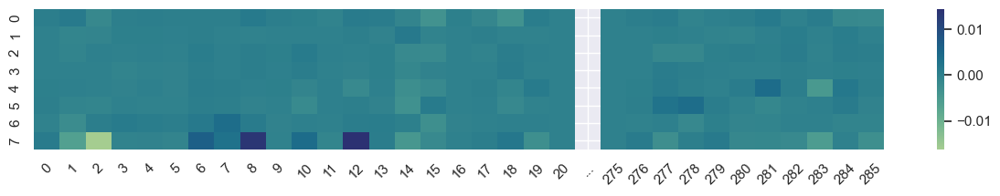

In [14]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

new_all_layer = []

for layer in all_layer_infos:
    front = [layer[i].numpy() for i in range(21)]
    gap = [np.full_like(layer[0].numpy(), np.nan)]
    back = [layer[i].numpy() for i in range(275, len(layer))]

    tmp_layer = front + gap + back
    new_all_layer.append(tmp_layer)

new_all_layer = np.array(new_all_layer)

xtick_labels = list(range(21)) + ['...'] + list(range(275, 286))

sns.set(rc={"figure.figsize": (15, 2)})
ax = sns.heatmap(new_all_layer, cmap="crest", cbar=True, xticklabels=xtick_labels)

ax.set_xticks(np.arange(len(xtick_labels)) + 0.5)
ax.set_xticklabels(xtick_labels, rotation=45)

ax.set_xticks(ax.get_xticks())
ax.set_xticklabels(xtick_labels)

#### Analysis of the above
The above attention analysis shows that there are a few tokens that actually seem to have decisive power for reaching and grabbing. It would be interesting to see if this pattern, and especially these tokens actually also collaborate across different objects which is what I will look at in the next section.

Additionally, we also see that the last layer in total is definitely the most decisive, but certain tokens gain more traction over the layers (esp 6, 7 8 or 1, 2, 14, 15). Layerwise, we cannot see strong differences. This might be interesting to analyze using the hidden states though... 